#### CosMX RNA Annot Cluster Data Analysis

This is an exploration of the CosMX RNA data

Goals
* Load and view the RNA data
* Under the cellular notation

In [3]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np

# # Load files on personal laptops
# expr = pd.read_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\CutdownRNAData\RNAexpression_Transpose-TMA-A Only.csv", index_col=0)
# metadata = pd.read_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\CutdownRNAData\RNAmetadata-TMA-A Only.csv", index_col=0)
# umap = pd.read_csv(r"C:\Users\evanj\OneDrive\Documents\Shapiro Data Files\CutdownRNAData\RNAumap-TMA-A Only.csv", index_col=0)

#Load files on Lab computer
expr = pd.read_csv(r"C:\Users\ejohns\Documents\Shapiro Data Files\RNAexpression_Transpose-TMA-A Only.csv", index_col=0)
metadata = pd.read_csv(r"C:\Users\ejohns\Documents\Shapiro Data Files\RNAmetadata-TMA-A Only.csv", index_col=0)
umap = pd.read_csv(r"C:\Users\ejohns\Documents\Shapiro Data Files\RNAumap-TMA-A Only.csv", index_col=0)


# Display General Data on the imported data. Run the import first
# display(expr.head(5))
# display(metadata.head(5))
# display(umap.head(5))
display(expr.columns)
display(expr.index)

# # Create AnnData object
adata = sc.AnnData(X=expr.values)

# # Assign metadata
adata.obs = metadata
adata.var_names = expr.columns
adata.obs_names = expr.index

# Add spatial coordinates and UMAP to .obsm
adata.obsm["spatial"] = metadata[['x_cent', 'y_cent']].values  # adjust if needed
adata.obsm["X_umap"] = umap.values

Index(['ABL1', 'ABL2', 'ACE', 'ACE2', 'ACKR1', 'ACKR3', 'ACKR4', 'ACTA2',
       'ACTG2', 'ACVR1',
       ...
       'NegPrb13', 'NegPrb14', 'NegPrb15', 'NegPrb16', 'NegPrb18', 'NegPrb19',
       'NegPrb20', 'NegPrb21', 'NegPrb22', 'NegPrb23'],
      dtype='object', length=978)

Index(['__Run5607.TMAA_1_1', '__Run5607.TMAA_2_1', '__Run5607.TMAA_3_1',
       '__Run5607.TMAA_4_1', '__Run5607.TMAA_5_1', '__Run5607.TMAA_6_1',
       '__Run5607.TMAA_7_1', '__Run5607.TMAA_8_1', '__Run5607.TMAA_9_1',
       '__Run5607.TMAA_10_1',
       ...
       '__Run5607.TMAA_3593_25', '__Run5607.TMAA_3594_25',
       '__Run5607.TMAA_3595_25', '__Run5607.TMAA_3597_25',
       '__Run5607.TMAA_3599_25', '__Run5607.TMAA_3600_25',
       '__Run5607.TMAA_3601_25', '__Run5607.TMAA_3602_25',
       '__Run5607.TMAA_3603_25', '__Run5607.TMAA_3604_25'],
      dtype='object', name='cell_ID', length=85390)

In [1]:
# Cell to transpose the CSV exrp data into a new files

import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np


import os
print(os.getcwd())

# Load files
expr_orig = pd.read_csv(r"C:\Users\evanj\OneDrive\Documents\RNAexpression.csv", index_col=0)
expr=expr_orig.transpose()
expr.to_csv("RNAexpression_Transpose.csv", index=False)

C:\Users\evanj\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\evanj\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\evanj\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,
C:\Users\evanj\anaconda3\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning

In [4]:
# Cell of analysis of the outputs of the cell above

display(metadata.tail(5))

# View Spatial Data
# Access and print spatial data
if 'spatial' in adata.obsm:
    print("Spatial coordinates (first 5 rows):")
    print(adata.obsm['spatial'][:5])
else:
    print("'spatial' key not found in adata.obsm")

,cell_ID,orig.ident,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT,predicted.id,prediction.score.CD8,prediction.score.CD4,prediction.score.Plasma,...,annot_cluster2,NhCoord10,NhCoord12,NhCoord15,NhCoord20,NhCoord6,NhCoord8,NhCoord20_anno,k10_NhCoord20,k10_NhCoord20_anno
cell_ID,,,,,,,,,,,,,,,,,,,,,
__Run5607.TMAA_3600_25,__Run5607.TMAA_3600_25,TMA_A_FOV25,24,19,101,32,Plasma,0.042639,0.016004,0.086955,...,Bcells,1,1,5,5,3,7,Fibroblast_Centric,16,CAFs
__Run5607.TMAA_3601_25,__Run5607.TMAA_3601_25,TMA_A_FOV25,24,19,93,32,CD4,0.031901,0.097762,0.040860,...,Bcells,1,4,4,4,3,1,Fibroblast_Immune_Mixed,10,CAF_Immune_Mixed
__Run5607.TMAA_3602_25,__Run5607.TMAA_3602_25,TMA_A_FOV25,51,35,122,37,CD4,0.096631,0.220655,0.027530,...,Tumors_Others,1,4,9,4,3,1,Fibroblast_Immune_Mixed,10,CAF_Immune_Mixed
__Run5607.TMAA_3603_25,__Run5607.TMAA_3603_25,TMA_A_FOV25,35,24,117,30,Epithelial cells,0.000000,0.004094,0.000000,...,Tumors_KRT17+,3,8,3,3,1,2,Tumor_Epi_Centric,4,Tumor_High
__Run5607.TMAA_3604_25,__Run5607.TMAA_3604_25,TMA_A_FOV25,48,31,125,34,Epithelial cells,0.000000,0.000000,0.000000,...,Tumors_KRT17+,7,2,11,11,2,2,Tumor_Epi_Centric,13,Tumor_High


Spatial coordinates (first 5 rows):
[[0.23319136 0.99697821]
 [0.62413351 0.99683615]
 [0.84565431 0.99728546]
 [0.39671849 0.99807504]
 [0.69936663 0.99870825]]


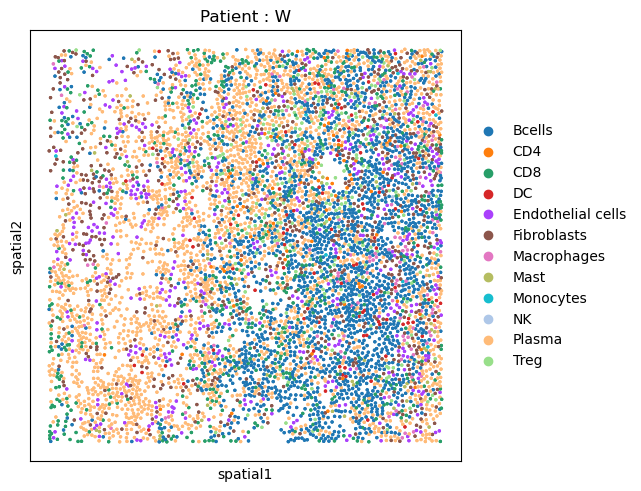

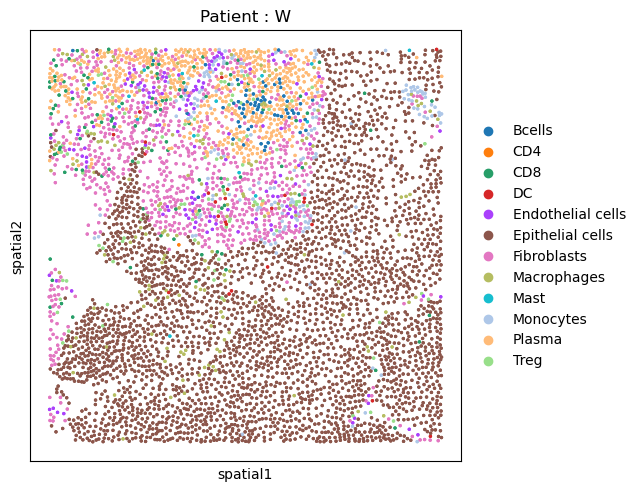

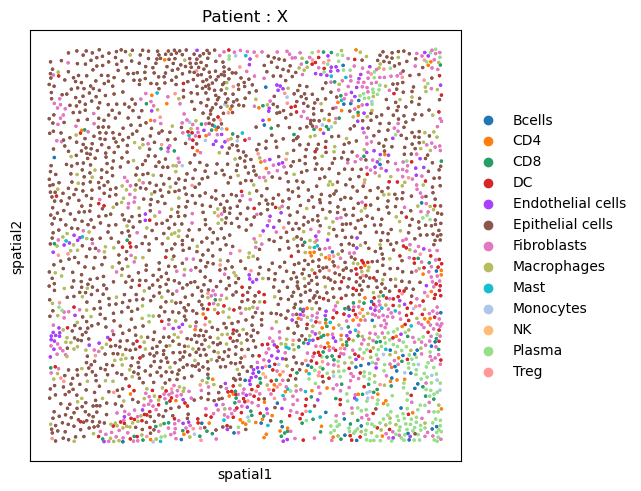

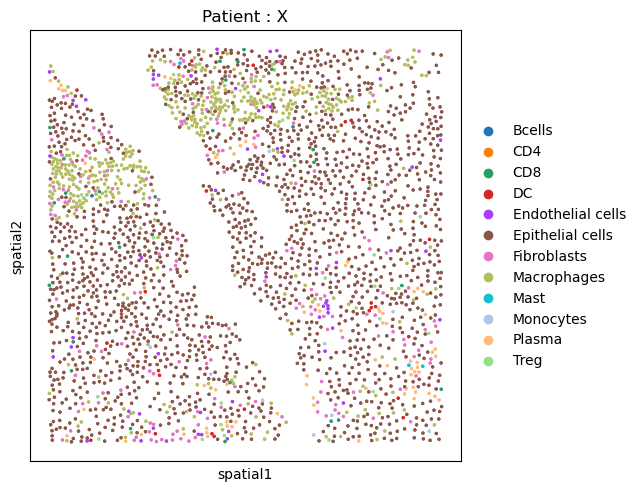

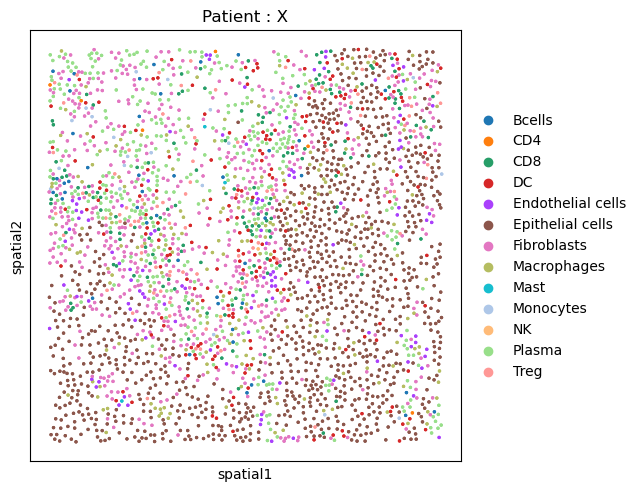

...

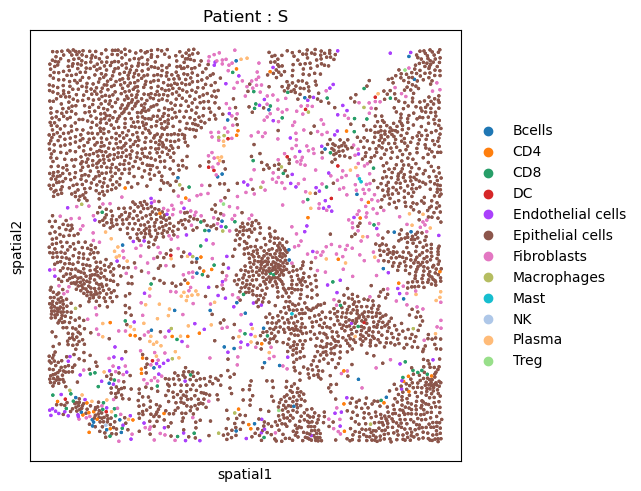

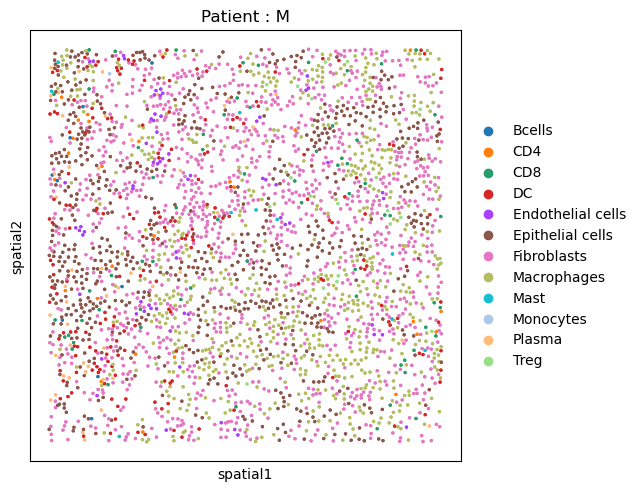

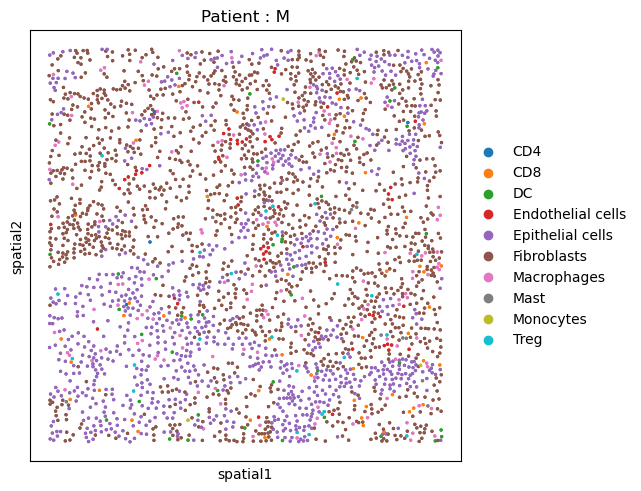

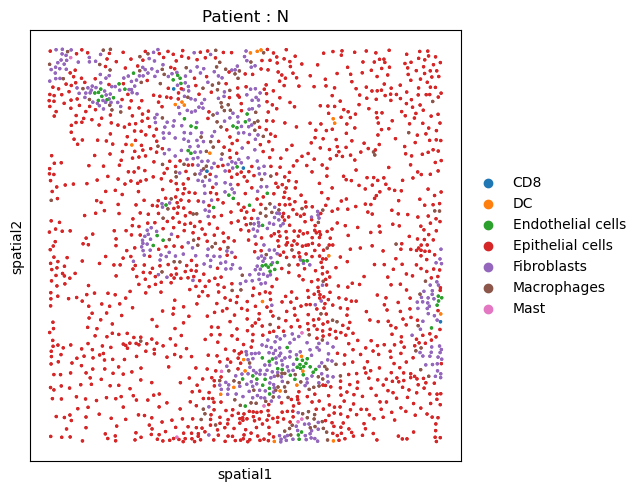

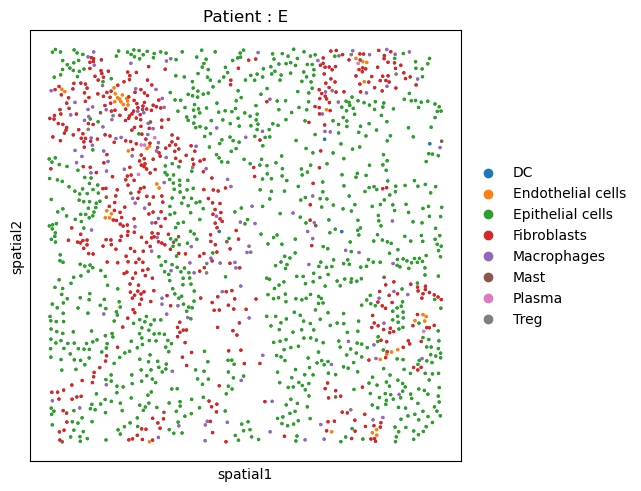

In [10]:
import squidpy as sq
import warnings
warnings.filterwarnings("ignore")
patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_1(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_1(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_2(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_2(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)
patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_3(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_3(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_4(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_4(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)
patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_5(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_5(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_6(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_6(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_7(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_7(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)


patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_8(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_8(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_9(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_9(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)


patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_10(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_10(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_11(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_11(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)


patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_12(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_12(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_13(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_13(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

patient_id = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_14(?!\d)")].obs["PatientID"].unique()[0]
sq.pl.spatial_scatter(
    adata[adata.obs.cell_ID.str.contains("TMAA_.+?_14(?!\d)")], shape=None, color="predicted.id", size=8, title=f"Patient : {patient_id}"
)

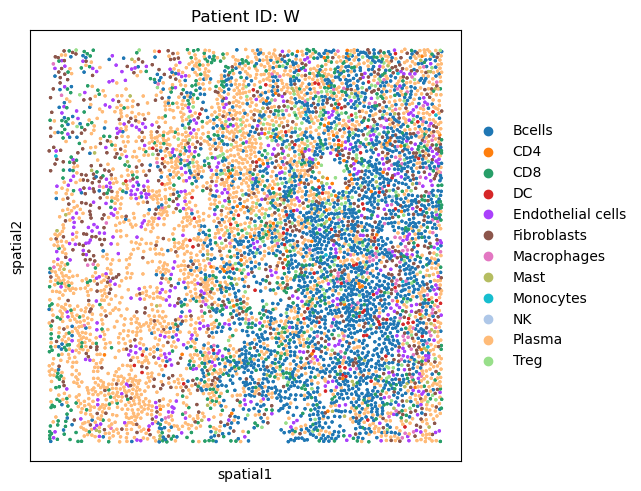

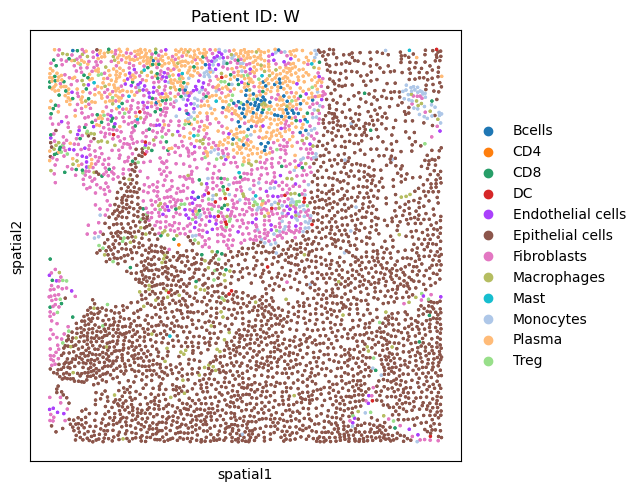

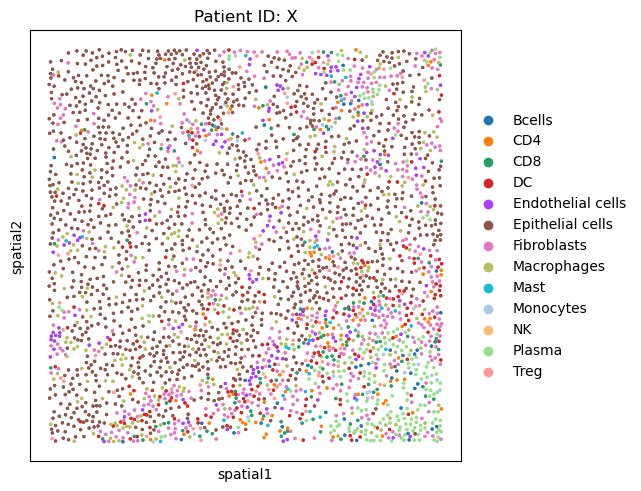

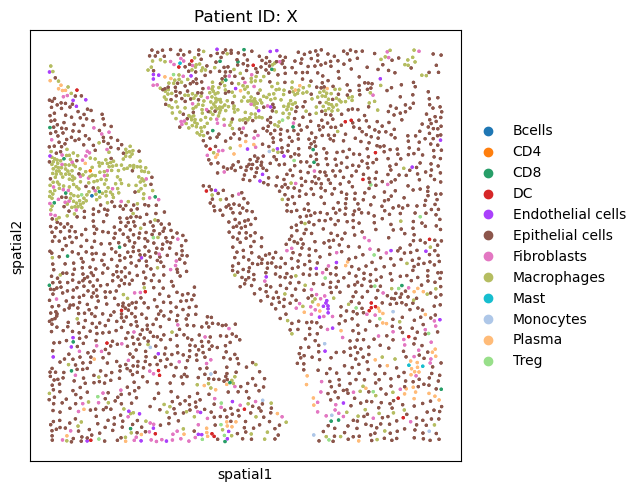

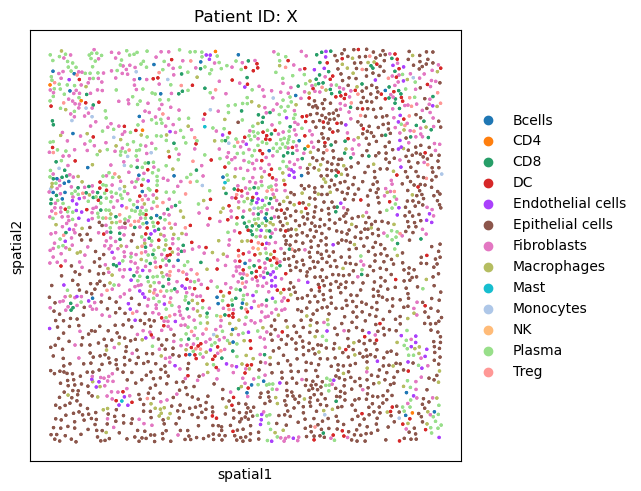

...

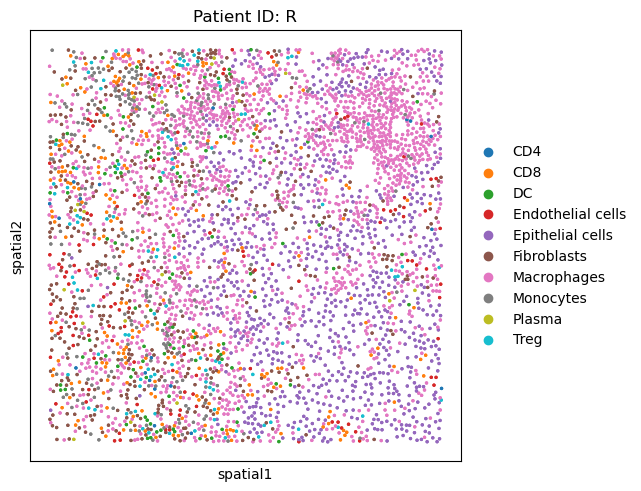

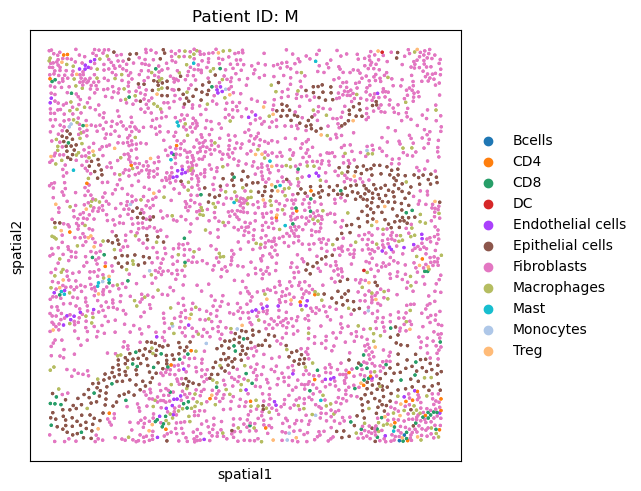

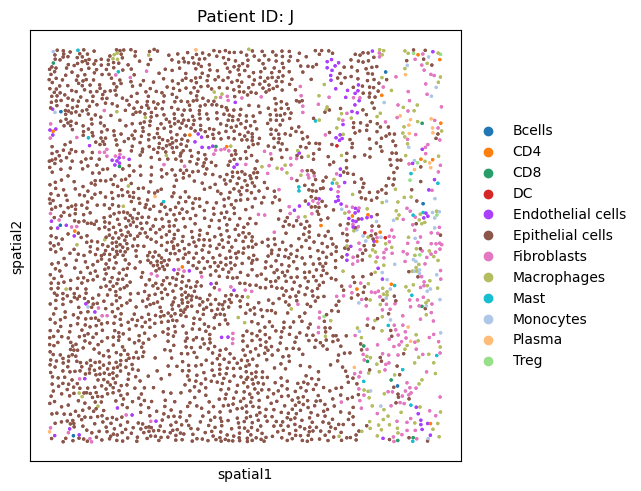

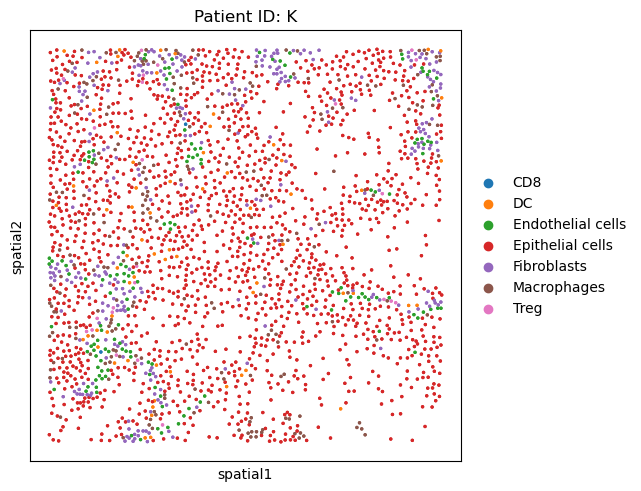

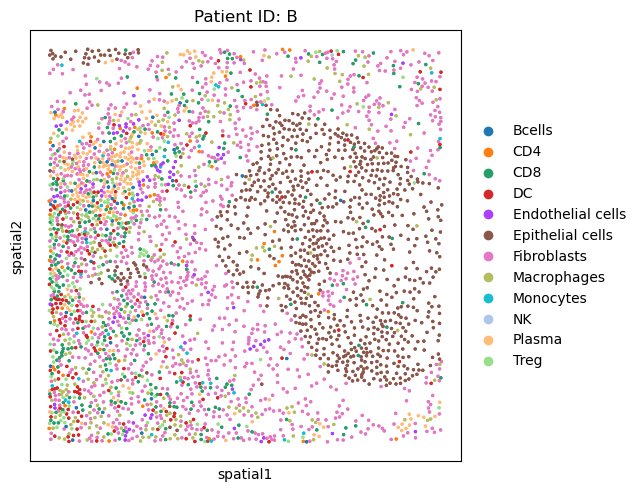

In [13]:
import squidpy as sq


for i in range(1, 26):
    cell_ID_like =f"TMAA_.+?_{i}(?!\d)"
    subset = adata[adata.obs.cell_ID.str.contains(cell_ID_like)]
    
    # Skip if no matching cells are found
    if subset.n_obs == 0:
        continue

    # Get the unique patient ID (assumes only one per subset)
    patient_id = subset.obs["PatientID"].unique()[0]

    # Plot with dynamic title
    sq.pl.spatial_scatter(
        subset,
        shape=None,
        color="predicted.id",
        size=8,
        title=f"Patient ID: {patient_id}"
    )

In [1]:
import numpy as np

# Makes subset of the adata object
adata_sub = adata[adata.obs.cell_ID.str.contains("TMAA_.+?_1(?!\d)")].copy()

# Ensure 'cell type' is categorical 
adata_sub.obs['predicted.id'] = adata_sub.obs['predicted.id'].astype('category')

for key in ['spatial_connectivities', 'spatial_distances']:
    if key in adata_sub.obsp:
        del adata_sub.obsp[key]

if 'spatial' in adata_sub.uns:
    del adata_sub.uns['spatial']
finite_mask = np.isfinite(adata_sub.obsm['spatial']).all(axis=1)
adata_sub = adata_sub[finite_mask].copy()

# Compute spatial neighbors on the subset
sq.gr.spatial_neighbors(adata_sub, coord_type="generic", spatial_key="spatial")

# Run neighborhood enrichment on the subset
sq.gr.nhood_enrichment(adata_sub, cluster_key="predicted.id")

# Plot neighborhood enrichment results from the subset
sq.pl.nhood_enrichment(
    adata_sub, 
    cluster_key="predicted.id", 
    method="single", 
    cmap="plasma", 
)                                                              

NameError: name 'adata' is not defined